<a href="https://colab.research.google.com/github/ShoyebKhan09/Detectron_Object_Detection./blob/main/Detectron_Object_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import os, sys
from google.colab import drive
drive.mount('/content/mnt')
nb_path = '/content/notebooks'
os.symlink('/content/mnt/My Drive/Colab Notebooks', nb_path)
sys.path.insert(0, nb_path)  # or append(nb_path)

Mounted at /content/mnt


In [ ]:
!pip install --target=$nb_path 'git+https://github.com/facebookresearch/detectron2.git'

In [2]:
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [ ]:
#bits_afternoon : https://drive.google.com/file/d/1Ye5M68fGPcCXxDRVUjBbIG1zHJ1fvDOQ/view?usp=sharing
#bits_library   : https://drive.google.com/file/d/1n6gIcX5eFPF8flMtzH9sjNnjqdzTk9ck/view?usp=sharing
#ba_classroom   : https://drive.google.com/file/d/148AA1wRjL71lcoKH2Q7FCKwLAALNu6vY/view?usp=sharing

In [3]:
!gdown --id 1Ye5M68fGPcCXxDRVUjBbIG1zHJ1fvDOQ
!gdown --id 1n6gIcX5eFPF8flMtzH9sjNnjqdzTk9ck
!gdown --id 148AA1wRjL71lcoKH2Q7FCKwLAALNu6vY

/usr/local/lib/python3.7/dist-packages/gdown/cli.py:131: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  category=FutureWarning,
Downloading...
From: https://drive.google.com/uc?id=1Ye5M68fGPcCXxDRVUjBbIG1zHJ1fvDOQ
To: /content/Bits_Afternoon.png
100% 551k/551k [00:00<00:00, 146MB/s]
/usr/local/lib/python3.7/dist-packages/gdown/cli.py:131: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  category=FutureWarning,
Downloading...
From: https://drive.google.com/uc?id=1n6gIcX5eFPF8flMtzH9sjNnjqdzTk9ck
To: /content/IMG_20221007_202014.jpg
100% 2.99M/2.99M [00:00<00:00, 199MB/s]
/usr/local/lib/python3.7/dist-packages/gdown/cli.py:131: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  category=FutureWarning,
Downloadi

In [4]:
bits_afternoon = '/content/Bits_Afternoon.png'
bits_library   = '/content/IMG_20221007_202014.jpg'
ba_classroom   = '/content/DSC_0920.JPG'

In [ ]:
im = cv2.imread(bits_afternoon)
cv2_imshow(im)

In [6]:
cfg = get_cfg()
# add project-specific config (e.g., TensorMask) here if you're not running a model in detectron2's core library
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model
# Find a model from detectron2's model zoo. You can use the https://dl.fbaipublicfiles... url as well
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
predictor = DefaultPredictor(cfg)
outputs = predictor(im)

model_final_f10217.pkl: 178MB [00:02, 88.3MB/s]                           
/content/notebooks/torch/functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2895.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


In [7]:
print(outputs["instances"].pred_classes)
print(outputs["instances"].pred_boxes)

tensor([74, 74, 58, 58, 58], device='cuda:0')
Boxes(tensor([[233.9803, 173.1387, 261.9200, 219.3940],
        [151.4819, 170.1524, 186.4819, 216.2327],
        [315.4421, 638.3334, 346.3799, 684.5072],
        [217.5040, 641.1133, 249.6206, 682.5824],
        [220.9364, 636.1172, 269.3118, 683.6786]], device='cuda:0'))


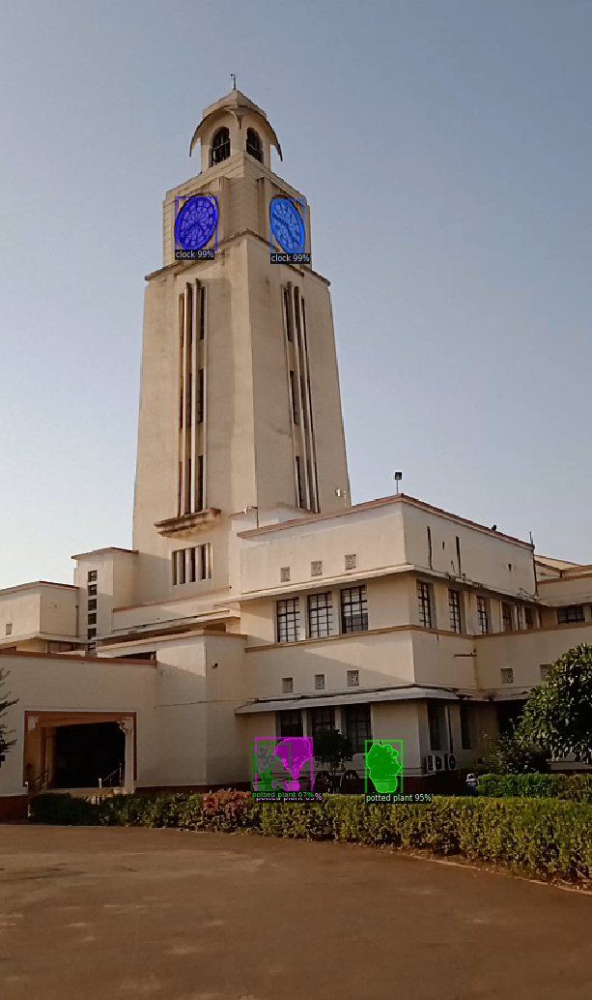

In [8]:
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

In [9]:
### Bits Library Image

In [ ]:
im = cv2.imread(bits_library)
cv2_imshow(im)

In [11]:
outputs = predictor(im)

In [12]:
print(outputs["instances"].pred_classes)
print(outputs["instances"].pred_boxes)

tensor([ 1,  1, 58,  1], device='cuda:0')
Boxes(tensor([[1772.8611, 2282.7300, 1918.1071, 2540.8486],
        [2731.1960, 2325.4775, 2922.2083, 2540.6150],
        [ 815.4117, 2058.5632, 1475.3163, 2494.7747],
        [2050.6084, 2267.4922, 2193.0042, 2529.8838]], device='cuda:0'))


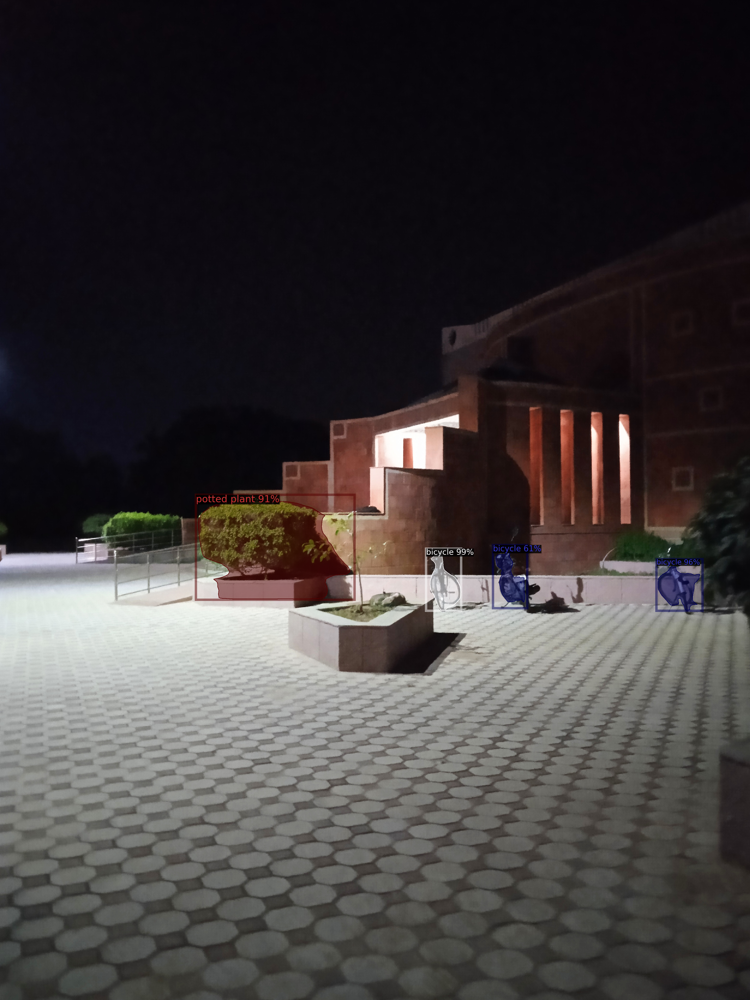

In [13]:
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

In [14]:
##ba_classroom image

In [ ]:
im = cv2.imread(ba_classroom)
#cv2_imshow(im)

tensor([ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 39,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 24, 56,  0,  0, 56,  0],
       device='cuda:0')
Boxes(tensor([[ 413.6362,  448.4508,  498.1994,  537.2403],
        [ 800.3929,  506.4535,  892.7605,  606.1098],
        [  50.3171,  458.3568,  155.4731,  547.2860],
        [ 242.4073,  456.9361,  344.1454,  543.8687],
        [ 611.0438,  523.2529,  685.6880,  605.8831],
        [1139.2587,  507.5959, 1201.0000,  628.8241],
        [ 601.0989,  459.8055,  661.5453,  529.4145],
        [ 491.8149,  370.1275,  545.6452,  412.8834],
        [1014.6171,  422.8755, 1082.3518,  488.4256],
        [ 589.1921,  362.6010,  643.4858,  413.9455],
        [  77.3695,  402.7900,  159.4548,  486.9961],
        [ 929.7240,  461.8776, 1001.7603,  538.4385],
        [ 600.2969,  565.8025,  613.5475,  610.0070],
        [1111.3090,  448.7377, 1185.3650,  543.6356],
        [ 432.9767,  391.4844,  484.9895,  440.9503],
   

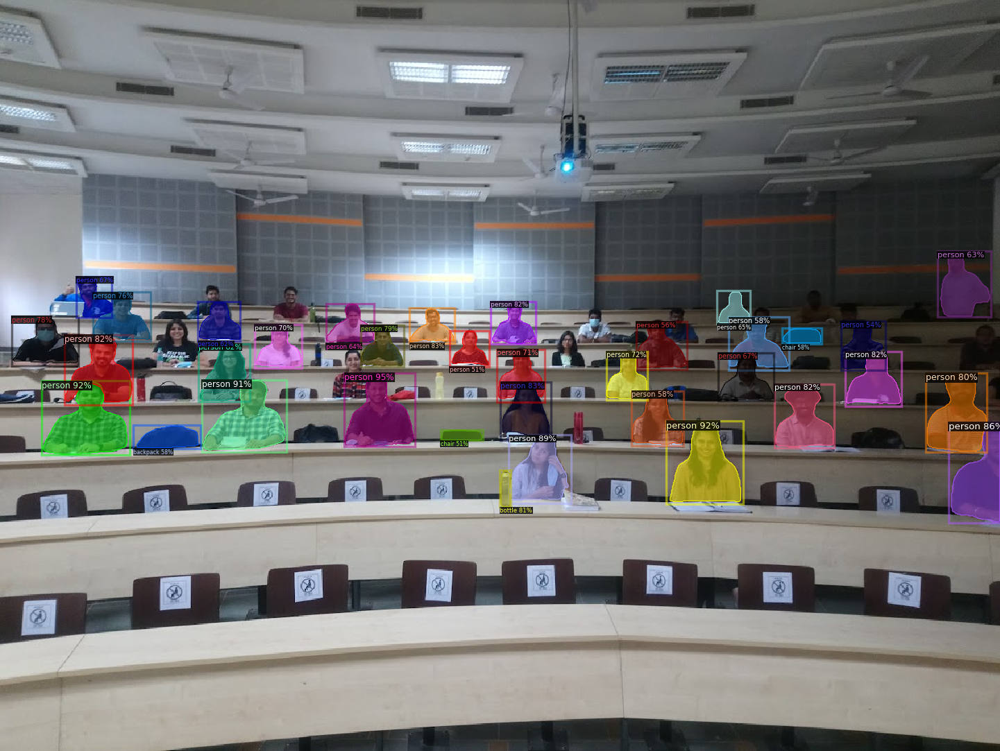

In [18]:
outputs = predictor(im)
print(outputs["instances"].pred_classes)
print(outputs["instances"].pred_boxes)
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

model_final_cafdb1.pkl: 261MB [00:03, 67.5MB/s]                           


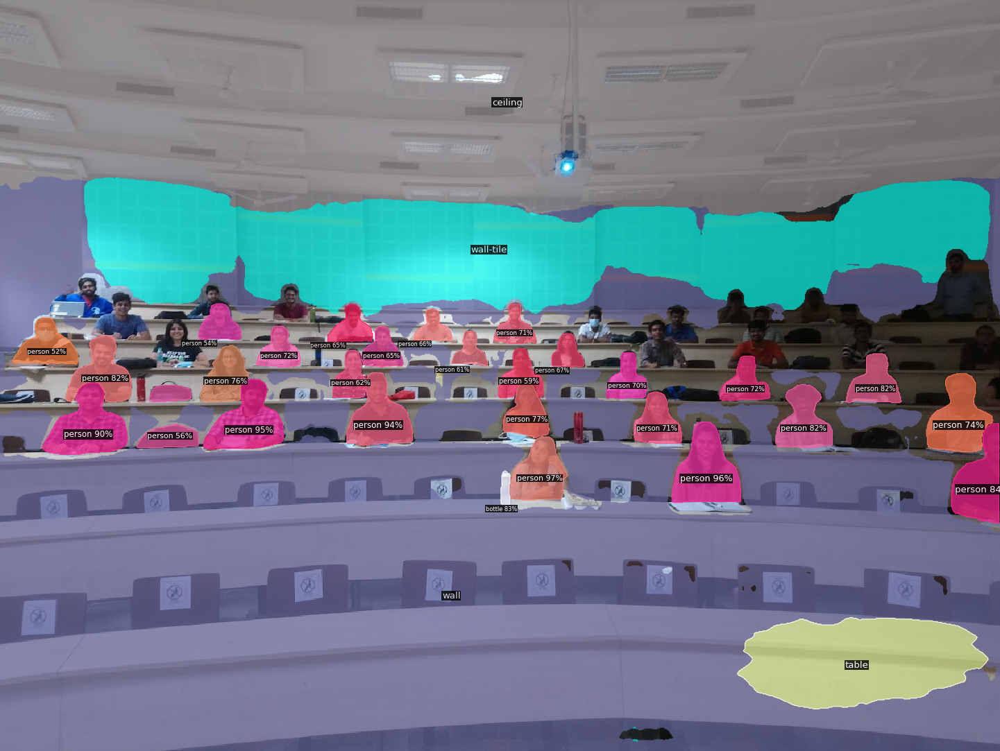

In [19]:
# Inference with a panoptic segmentation model
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-PanopticSegmentation/panoptic_fpn_R_101_3x.yaml"))
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-PanopticSegmentation/panoptic_fpn_R_101_3x.yaml")
predictor = DefaultPredictor(cfg)
panoptic_seg, segments_info = predictor(im)["panoptic_seg"]
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_panoptic_seg_predictions(panoptic_seg.to("cpu"), segments_info)
cv2_imshow(out.get_image()[:, :, ::-1])

In [20]:
## Panoptic segmentation model on video

In [21]:
# bits_afternoon_video : https://drive.google.com/file/d/1FvpaX4kaqtiEnsfj9o4vjAjbEd8Pt6ea/view?usp=sharing

!gdown --id 1FvpaX4kaqtiEnsfj9o4vjAjbEd8Pt6ea

/usr/local/lib/python3.7/dist-packages/gdown/cli.py:131: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  category=FutureWarning,
Downloading...
From: https://drive.google.com/uc?id=1FvpaX4kaqtiEnsfj9o4vjAjbEd8Pt6ea
To: /content/bits_afternoon.mp4
100% 13.3M/13.3M [00:00<00:00, 36.6MB/s]


In [ ]:
#sample_video = cv2.VideoCapture('/content/bits_afternoon.mp4')
#sample_video = '/content/bits_afternoon.mp4'

!ffmpeg -i '/content/bits_afternoon.mp4' -t 00:00:06 -c:v copy video-clip.mp4

In [27]:
!git clone  https://github.com/facebookresearch/detectron2 

Cloning into 'detectron2'...
remote: Enumerating objects: 14560, done.
remote: Counting objects: 100% (33/33), done.
remote: Compressing objects: 100% (27/27), done.
remote: Total 14560 (delta 11), reused 16 (delta 6), pack-reused 14527
Receiving objects: 100% (14560/14560), 5.96 MiB | 26.87 MiB/s, done.
Resolving deltas: 100% (10521/10521), done.


In [30]:
y%run detectron2/demo/demo.py --config-file detectron2/configs/COCO-PanopticSegmentation/panoptic_fpn_R_101_3x.yaml --video-input video-clip.mp4 --confidence-threshold 0.6 --output video-output.mkv \
  --opts MODEL.WEIGHTS detectron2://COCO-PanopticSegmentation/panoptic_fpn_R_101_3x/139514519/model_final_cafdb1.pkl

[10/08 06:20:01 detectron2]: Arguments: Namespace(confidence_threshold=0.6, config_file='detectron2/configs/COCO-PanopticSegmentation/panoptic_fpn_R_101_3x.yaml', input=None, opts=['MODEL.WEIGHTS', 'detectron2://COCO-PanopticSegmentation/panoptic_fpn_R_101_3x/139514519/model_final_cafdb1.pkl'], output='video-output.mkv', video_input='video-clip.mp4', webcam=False)
[10/08 06:20:03 fvcore.common.checkpoint]: [Checkpointer] Loading from detectron2://COCO-PanopticSegmentation/panoptic_fpn_R_101_3x/139514519/model_final_cafdb1.pkl ...
[10/08 06:20:03 fvcore.common.checkpoint]: Reading a file from 'Detectron2 Model Zoo'


100%|██████████| 172/172 [04:17<00:00,  1.50s/it]


In [31]:
from google.colab import files
files.download('video-output.mkv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
####################################################The End###########################################################